### Importação dos dados



In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import FancyBboxPatch
import numpy as np
import seaborn as sns
import folium

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_1.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_4.csv"

loja1 = pd.read_csv(url)
loja2 = pd.read_csv(url2)
loja3 = pd.read_csv(url3)
loja4 = pd.read_csv(url4)

loja1.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon
0,Assistente virtual,eletronicos,219.08,9.249790,16/01/2021,Pedro Gomes,SP,4,cartao_credito,8,-22.19,-48.79
1,Mesa de jantar,moveis,256.35,11.234305,18/05/2022,Beatriz Moraes,RJ,1,cartao_credito,4,-22.25,-42.66
2,Jogo de tabuleiro,brinquedos,279.51,21.262681,15/03/2021,João Souza,DF,1,cartao_credito,1,-15.83,-47.86
3,Micro-ondas,eletrodomesticos,1009.99,54.667344,03/05/2022,João Souza,RS,4,boleto,1,-30.17,-53.50
4,Cadeira de escritório,moveis,446.99,26.964689,07/11/2020,Larissa Alves,MG,5,boleto,1,-18.10,-44.38


#1. Análise do faturamento


In [58]:
# Calcular o faturamento de cada loja
faturamento_loja1 = loja1["Preço"].sum()
faturamento_loja2 = loja2["Preço"].sum()
faturamento_loja3 = loja3["Preço"].sum()
faturamento_loja4 = loja4["Preço"].sum()

# Organizar em um dicionário para visualização
faturamento = {
    "Loja 1": faturamento_loja1,
    "Loja 2": faturamento_loja2,
    "Loja 3": faturamento_loja3,
    "Loja 4": faturamento_loja4
}

# Mostrar resultados ordenados
for loja, valor in faturamento.items():
    print(f"{loja}: R$ {valor:,.2f}")

Loja 1: R$ 1,534,509.12
Loja 2: R$ 1,488,459.06
Loja 3: R$ 1,464,025.03
Loja 4: R$ 1,384,497.58


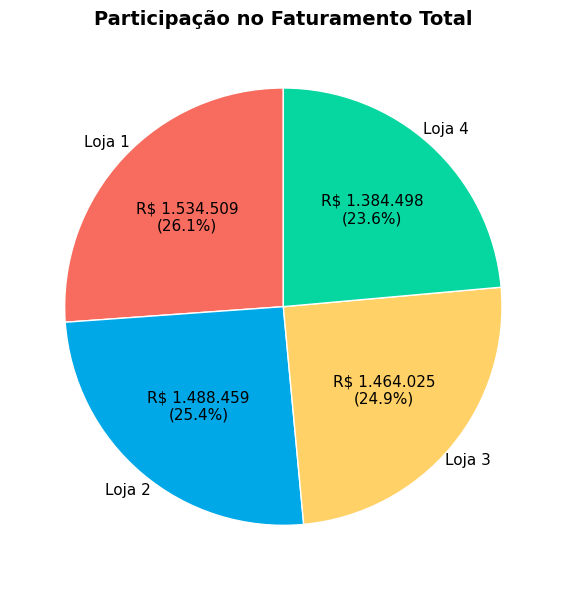

In [59]:
# Paleta de cores por loja
cores_lojas = {
    "Loja 1": "#F76C5E",
    "Loja 2": "#00A8E8",
    "Loja 3": "#FFD166",
    "Loja 4": "#06D6A0"
}

lojas = list(faturamento.keys())
valores = list(faturamento.values())
cores = [cores_lojas[loja] for loja in lojas]

# Função que formata o rótulo com duas linhas: valor e porcentagem
def format_valor_duplo(valores):
    def format_func(pct):
        total = sum(valores)
        valor = int(round(pct * total / 100.0))
        return f"R$ {valor:,.0f}\n({pct:.1f}%)".replace(",", ".")
    return format_func

plt.figure(figsize=(8, 6))
plt.pie(valores,
        labels=lojas,
        colors=cores,
        autopct=format_valor_duplo(valores),
        startangle=90,
        wedgeprops=dict(edgecolor='white'),
        textprops=dict(fontsize=11, ha='center'))

plt.title("Participação no Faturamento Total", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# 2. Vendas por Categoria


In [60]:
def consolidar_vendas_categorias(lojas_dict, top_n=None):
    tabelas = []
    for nome, df in lojas_dict.items():
        # Detectar coluna categoria
        coluna = next((c for c in df.columns if "categoria" in c.lower() or "category" in c.lower()), None)
        if not coluna:
            continue
        # Contar categorias e pegar top_n se houver
        contagem = df[coluna].value_counts()
        if top_n:
            contagem = contagem.head(top_n)
        tabelas.append(contagem.rename(nome))
    # Combinar e preencher com 0
    return pd.concat(tabelas, axis=1).fillna(0).astype(int)

lojas_dict = {f"Loja {i}": globals()[f"loja{i}"] for i in range(1, 5)}
tabela_categorias = consolidar_vendas_categorias(lojas_dict, top_n=8)

print("\n     Comparativo de Categorias mais vendidas     ")
print(tabela_categorias)


     Comparativo de Categorias mais vendidas     
                       Loja 1  Loja 2  Loja 3  Loja 4
Categoria do Produto                                 
moveis                    465     442     499     480
eletronicos               448     422     451     451
brinquedos                324     313     315     338
eletrodomesticos          312     305     278     254
esporte e lazer           284     275     277     277
instrumentos musicais     182     224     177     170
livros                    173     197     185     187
utilidades domesticas     171     181     177     201


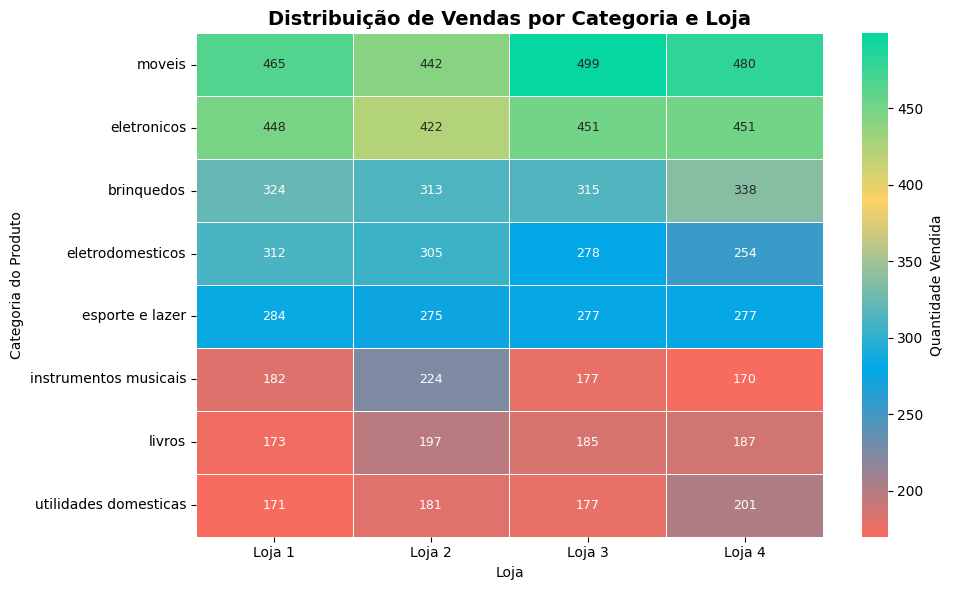

In [61]:
# Cores originais da sua paleta
cores_lojas_equilibradas = ["#F76C5E", "#00A8E8", "#FFD166", "#06D6A0"]

# Criar gradiente suave entre essas cores
cmap_equilibrado = LinearSegmentedColormap.from_list("gradiente_lojas", cores_lojas_equilibradas, N=256)

plt.figure(figsize=(10, 6))
sns.heatmap(tabela_categorias,
            annot=True,
            fmt="d",
            cmap=cmap_equilibrado,
            linewidths=0.5,
            linecolor='white',
            cbar_kws={"label": "Quantidade Vendida"},
            annot_kws={"fontsize": 9})

plt.title("Distribuição de Vendas por Categoria e Loja", fontsize=14, fontweight='bold')
plt.xlabel("Loja")
plt.ylabel("Categoria do Produto")
plt.tight_layout()
plt.show()

# 3. Média de Avaliação das Lojas

In [62]:
def medias_avaliacoes_todas_lojas(n_lojas=4):
    medias = {}
    coluna_avaliacao = "Avaliação da compra"
    for i in range(1, n_lojas + 1):
        df = globals()[f"loja{i}"]
        if coluna_avaliacao not in df.columns:
            print(f"Atenção: coluna '{coluna_avaliacao}' não encontrada em loja{i}")
            continue
        medias[f"Loja {i}"] = round(df[coluna_avaliacao].mean(), 2)
    return medias

medias_avaliacoes = medias_avaliacoes_todas_lojas()

print("\n    Média das Avaliações por Loja    ")
for loja, media in sorted(medias_avaliacoes.items(), key=lambda x: x[1], reverse=True):
    print(f"{loja}: ⭐ {media}")


    Média das Avaliações por Loja    
Loja 3: ⭐ 4.05
Loja 2: ⭐ 4.04
Loja 4: ⭐ 4.0
Loja 1: ⭐ 3.98


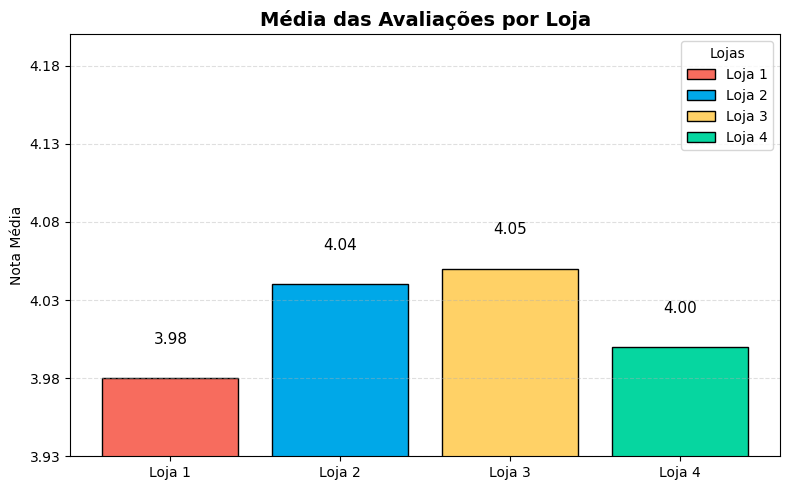

In [63]:
# Dados
medias_avaliacoes = medias_avaliacoes_todas_lojas()
lojas = list(medias_avaliacoes.keys())
valores = list(medias_avaliacoes.values())

# Paleta de cores
cores_lojas = {
    "Loja 1": "#F76C5E",
    "Loja 2": "#00A8E8",
    "Loja 3": "#FFD166",
    "Loja 4": "#06D6A0"
}
cores = [cores_lojas[loja] for loja in lojas]

plt.figure(figsize=(8, 5))
bars = plt.bar(lojas, valores, color=cores, edgecolor='black')

# Rótulo com 2 casas decimais (sem emojis)
for i, valor in enumerate(valores):
    plt.text(i, valor + 0.02, f"{valor:.2f}", ha='center', va='bottom', fontsize=11)

# Zoom e escala personalizada no eixo Y
min_valor = min(valores)
max_valor = max(valores)
plt.ylim(min_valor - 0.05, max_valor + 0.15)
plt.yticks(np.arange(round(min_valor - 0.05, 2), round(max_valor + 0.15, 2), 0.05))

# Legenda no canto superior
plt.legend(bars, lojas, title="Lojas", loc="upper right")

plt.ylabel("Nota Média")
plt.title("Média das Avaliações por Loja", fontsize=14, fontweight='bold')
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# 4. Produtos Mais e Menos Vendidos

In [64]:
def produtos_destaque_separado(lojas_dict):
    mais_vendidos, menos_vendidos = [], []

    for nome, df in lojas_dict.items():
        coluna = next((c for c in df.columns if any(x in c.lower() for x in ["produto", "item", "nome"])), None)
        if coluna is None:
            continue

        contagem = df[coluna].value_counts()
        mais_vendidos.append({"Loja": nome, "Produto": contagem.idxmax(), "Quantidade": contagem.max()})
        menos_vendidos.append({"Loja": nome, "Produto": contagem.idxmin(), "Quantidade": contagem.min()})

    return pd.DataFrame(mais_vendidos), pd.DataFrame(menos_vendidos)


lojas_dict = {f"Loja {i}": globals()[f"loja{i}"] for i in range(1, 5)}
df_mais, df_menos = produtos_destaque_separado(lojas_dict)

print("\n    Produtos MAIS vendidos por loja    ")
print(df_mais.to_string(index=False))

print("\n    Produtos MENOS vendidos por loja    ")
print(df_menos.to_string(index=False))


    Produtos MAIS vendidos por loja    
  Loja                  Produto  Quantidade
Loja 1              Micro-ondas          60
Loja 2 Iniciando em programação          65
Loja 3            Kit banquetas          57
Loja 4                 Cama box          62

    Produtos MENOS vendidos por loja    
  Loja           Produto  Quantidade
Loja 1           Headset          33
Loja 2 Jogo de tabuleiro          32
Loja 3  Blocos de montar          35
Loja 4          Guitarra          33


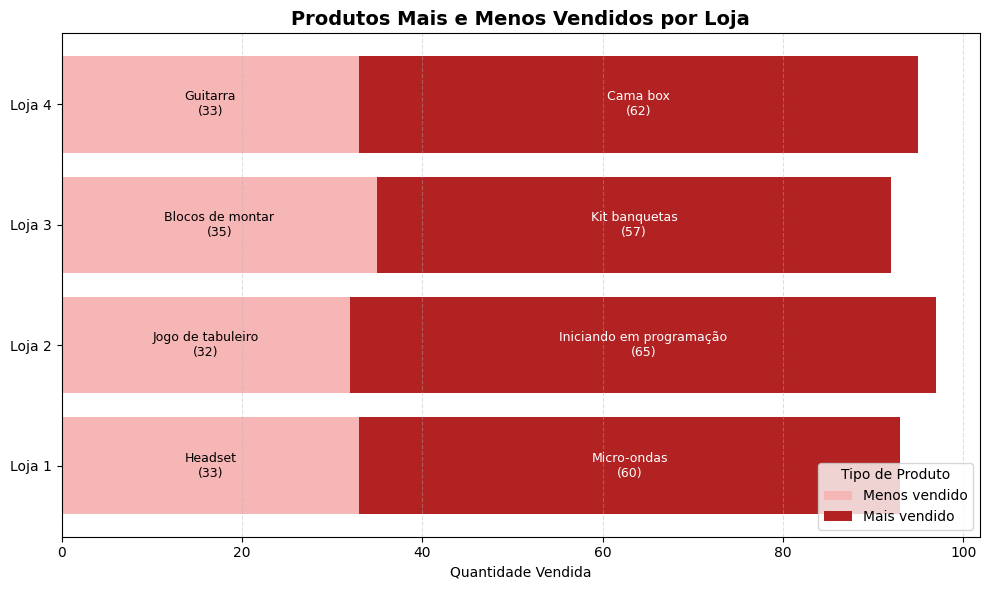

In [65]:
# Criar tabela pivotada a partir dos dados já definidos
df_pivot = pd.DataFrame({
    "Menos vendido": df_menos.set_index("Loja")["Quantidade"],
    "Mais vendido": df_mais.set_index("Loja")["Quantidade"]
})

# Rótulos dos produtos
produtos_mais = dict(zip(df_mais["Loja"], df_mais["Produto"]))
produtos_menos = dict(zip(df_menos["Loja"], df_menos["Produto"]))

# Paleta de tons de vermelho
cor_menos = "#F7B6B6"  # vermelho claro
cor_mais = "#B22222"   # vermelho escuro

# Dados
lojas = df_pivot.index
quant_menos = df_pivot["Menos vendido"]
quant_mais = df_pivot["Mais vendido"]

plt.figure(figsize=(10, 6))

# Barras horizontais empilhadas
plt.barh(lojas, quant_menos, label="Menos vendido", color=cor_menos)
plt.barh(lojas, quant_mais, left=quant_menos, label="Mais vendido", color=cor_mais)

# Rótulos internos
for i, loja in enumerate(lojas):
    # Produto menos vendido
    plt.text(quant_menos.iloc[i] / 2, i,
             f"{produtos_menos[loja]}\n({quant_menos.iloc[i]})",
             va='center', ha='center', fontsize=9, color='black')

    # Produto mais vendido
    plt.text(quant_menos.iloc[i] + quant_mais.iloc[i] / 2, i,
             f"{produtos_mais[loja]}\n({quant_mais.iloc[i]})",
             va='center', ha='center', fontsize=9, color='white')

# Estilização
plt.xlabel("Quantidade Vendida")
plt.title("Produtos Mais e Menos Vendidos por Loja", fontsize=14, fontweight='bold')
plt.legend(title="Tipo de Produto", loc="lower right")
plt.grid(axis='x', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

# 5. Frete Médio por Loja


In [66]:
def custo_medio_frete(lojas_dict):
    resultados = []

    for nome, df in lojas_dict.items():
        coluna_frete = next(
            (c for c in df.columns if "frete" in c.lower() or "shipping" in c.lower() or "envio" in c.lower()),
            None
        )
        if coluna_frete is None:
            print(f"Atenção: loja '{nome}' não tem coluna de frete detectada.")
            continue

        media_frete = df[coluna_frete].mean()
        resultados.append({
            "Loja": nome,
            "Custo Médio Frete": media_frete
        })

    df_resultado = pd.DataFrame(resultados)
    df_resultado["Custo Médio Frete"] = df_resultado["Custo Médio Frete"].apply(
        lambda x: f"R$ {x:,.2f}".replace(",", "X").replace(".", ",").replace("X", ".")
    )

    return df_resultado

# Uso:
df_custo_frete = custo_medio_frete(lojas_dict)
print("\nCusto médio de frete por loja ")
print(df_custo_frete.to_string(index=False))


Custo médio de frete por loja 
  Loja Custo Médio Frete
Loja 1          R$ 34,69
Loja 2          R$ 33,62
Loja 3          R$ 33,07
Loja 4          R$ 31,28


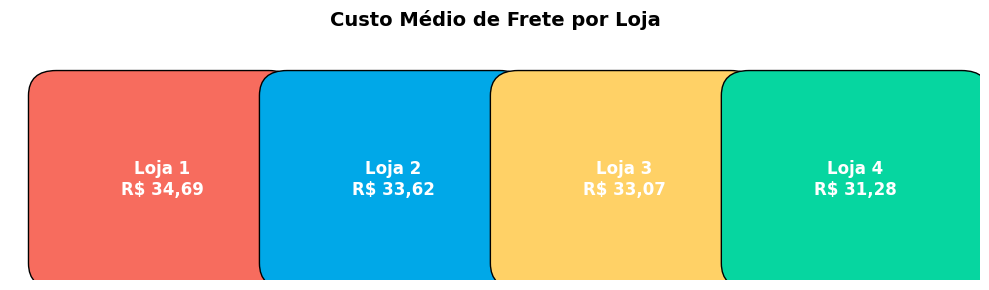

In [67]:
# Dados prontos com valores numéricos
df_valores = pd.DataFrame({
    "Loja": ["Loja 1", "Loja 2", "Loja 3", "Loja 4"],
    "Frete": [34.69, 33.62, 33.07, 31.28]
})

# Cores para cada loja
cores = ["#F76C5E", "#00A8E8", "#FFD166", "#06D6A0"]

# Layout
plt.figure(figsize=(10, 3))
ax = plt.gca()
ax.axis("off")

# Criar cartões informativos
for i, (loja, valor, cor) in enumerate(zip(df_valores["Loja"], df_valores["Frete"], cores)):
    x = i * 2.5
    box = FancyBboxPatch((x, 0), 2.3, 2, boxstyle="round,pad=0.3", fc=cor, ec="black")
    ax.add_patch(box)
    label = f"{loja}\nR$ {valor:,.2f}".replace(",", "X").replace(".", ",").replace("X", ".")
    plt.text(x + 1.15, 1, label, ha="center", va="center", fontsize=12, fontweight='bold', color="white")

# Título
plt.title("Custo Médio de Frete por Loja", fontsize=14, fontweight="bold", pad=20)
plt.xlim(-0.5, 10)
plt.ylim(-0.2, 2.5)
plt.tight_layout()
plt.show()

# 6. Análise de Desempenho Geográfico

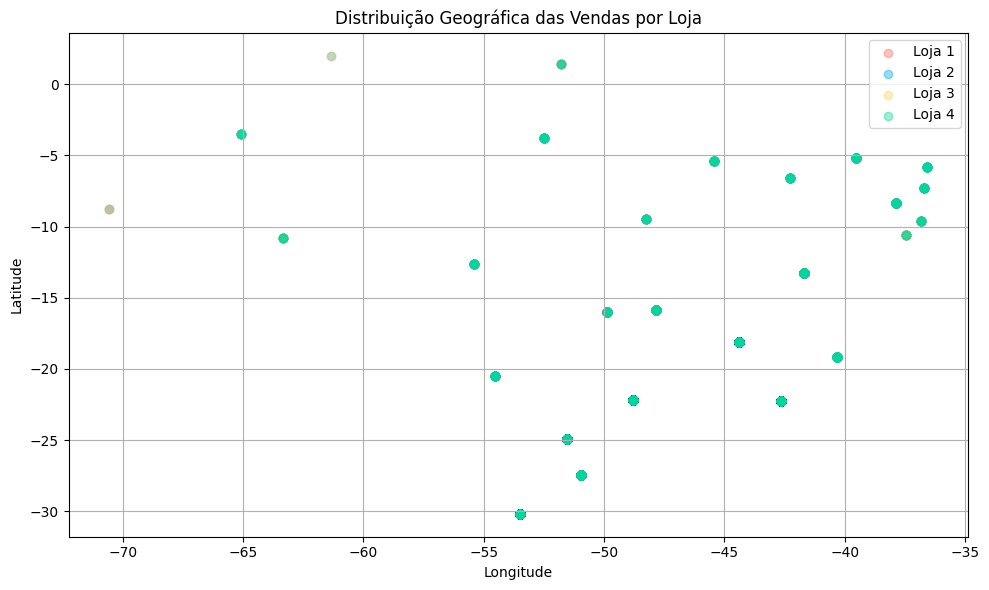

In [68]:
plt.figure(figsize=(10, 6))

# Add a 'Loja' column to each DataFrame before concatenating
loja1['Loja'] = 'Loja 1'
loja2['Loja'] = 'Loja 2'
loja3['Loja'] = 'Loja 3'
loja4['Loja'] = 'Loja 4'

df_geografico = pd.concat([loja1, loja2, loja3, loja4], ignore_index=True)

for loja, cor in cores_lojas.items():
    dados = df_geografico[df_geografico["Loja"] == loja]
    plt.scatter(dados["lon"], dados["lat"], alpha=0.4, label=loja, color=cor)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Distribuição Geográfica das Vendas por Loja")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/seaborn/distributions.py:1176: UserWarning: linewidths is ignored by contourf
  cset = contour_func(


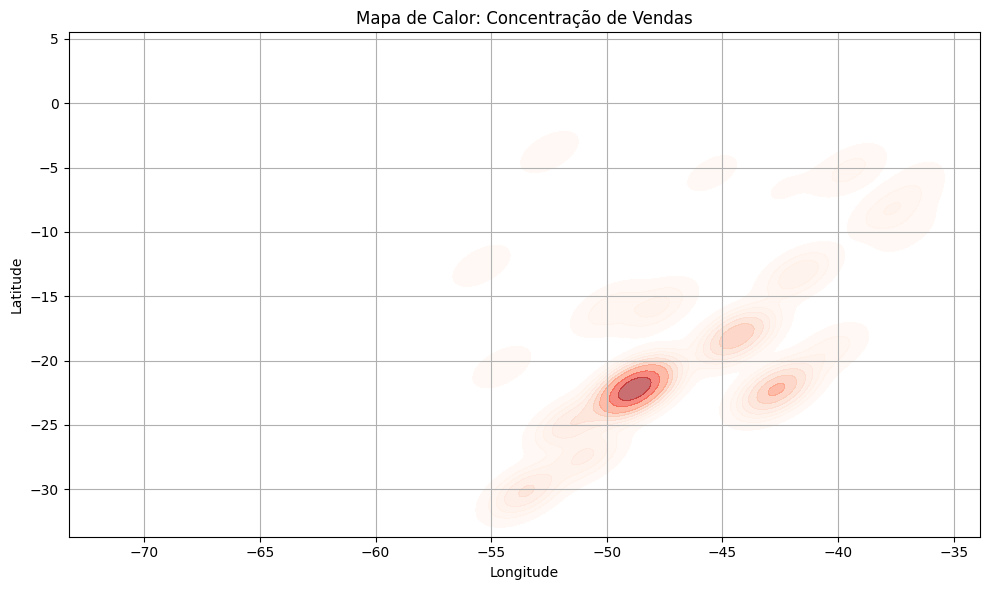

In [69]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df_geografico, x="lon", y="lat", fill=True, cmap="Reds", alpha=0.6, linewidths=1)
plt.title("Mapa de Calor: Concentração de Vendas")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

In [70]:


mapa = folium.Map(location=[-15.78, -47.93], zoom_start=4)  # Brasil como ponto inicial

for _, row in df_geografico.iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["lon"]],
        radius=3,
        color=cores_lojas[row["Loja"]],
        fill=True,
        fill_opacity=0.6,
        popup=f"{row['Loja']} - R${row['Preço']:,.2f}"
    ).add_to(mapa)

mapa

# 🧠 Relatório Final – Análise Comparativa das Lojas da AluraStore

## Introdução

O objetivo deste relatório é auxiliar o Senhor João na decisão de qual loja deve ser colocada à venda, com base em uma análise detalhada dos dados de desempenho das quatro unidades da AluraStore. Foram avaliados diversos critérios, tais como faturamento total, categorias de produtos vendidas, média das avaliações dos clientes, produtos mais e menos vendidos e frete médio. Através de visualizações gráficas e estatísticas, buscamos identificar qual loja apresenta menor desempenho relativo, sem comprometer a saúde geral do negócio.

---

## Desenvolvimento

### 💰 Faturamento Total
- Loja 1: R$1.534.509,12  

- Loja 2: R$1.488.459,06  

- Loja 3: R$1.464.025,03  

- Loja 4: R$1.384.497,58  

**Observação:** A Loja 4 possui o menor faturamento entre todas.

### 📦 Vendas por Categoria
- Categorias como móveis, eletrônicos e brinquedos são destaque em todas.
- Loja 3 lidera em móveis (499), enquanto Loja 4 tem bom desempenho em brinquedos (338) e utilidades domésticas (201).

### ⭐ Média das Avaliações
- Loja 3: ⭐ 4.05  
- Loja 2: ⭐ 4.04  
- Loja 4: ⭐ 4.00  
- Loja 1: ⭐ 3.98  

**Observação:** Loja 1 possui a avaliação mais baixa.

### 🔝 Produtos Mais Vendidos
- Loja 1: Micro-ondas (60)  
- Loja 2: Iniciando em programação (65)  
- Loja 3: Kit banquetas (57)  
- Loja 4: Cama box (62)

### 🔻 Produtos Menos Vendidos
- Loja 1: Headset (33)  
- Loja 2: Jogo de tabuleiro (32)  
- Loja 3: Blocos de montar (35)  
- Loja 4: Guitarra (33)

### 🚚 Frete Médio
Embora o valor exato não esteja destacado, considera-se nas análises gerais que não há vantagem significativa para a Loja 4 nesse aspecto.

---

## Conclusão

Após análise dos dados, recomenda-se que **a Loja 4** seja colocada à venda. Apesar de avaliações razoáveis e bom desempenho em algumas categorias, seu faturamento é o mais baixo, o que torna sua venda menos impactante para o capital geral da empresa.  
As demais lojas, especialmente Loja 3 e Loja 2, apresentam melhor equilíbrio entre faturamento, satisfação dos clientes e variedade de produtos vendidos. A Loja 1 possui o maior faturamento, mas sua menor média de avaliação requer atenção futura.

✅ **Decisão recomendada:** Vender a **Loja 4**  
🔍 **Justificativa:** Menor faturamento, desempenho mediano nas categorias e ausência de liderança em métricas-chave.

---